<a href="https://colab.research.google.com/github/carlos-ortiz03/Motion-Tracking-Cars/blob/main/Motion_Tracking_Cars.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [13]:
from IPython.display import display, Javascript, Image
from google.colab.output import eval_js
from base64 import b64decode, b64encode
import cv2
import numpy as np
import os
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow

#Reading video file & extract the moving frames only

In [14]:
output_pathpath = '/content/drive/MyDrive/Computer Vissions/Module 6/Take Home Project/Videoframes/'
vpath = '/content/drive/MyDrive/Computer Vissions/Module 6/Take Home Project/'

cap = cv2.VideoCapture(vpath + "roadsVid.mp4")

if not cap.isOpened():
  print("Error: Could not open video file.")
  exit()

prev_frame = None
count = 0

output_path = output_pathpath
os.chdir(output_pathpath)

while True:
  ret, frame = cap.read()

  if frame is None:
    break
  if prev_frame is not None:
    # Obtain the difference from the current frame and the last frame
    diff_frame = cv2.absdiff(prev_frame, frame)
    # Turn to grayscale to make compare the data since it makes it much simpler
    # due to only having to acccount for one channel
    diff_frame_gray = cv2.cvtColor(diff_frame, cv2.COLOR_BGR2GRAY)
    # See the differences in the frame
    diff_pixels = cv2.countNonZero(diff_frame_gray)

    threshold = 2000
    # save the image in files that surpasses the threshold to use later in
    # motion tracking
    if diff_pixels > threshold:
      cv2.imwrite(output_pathpath+ "%d.png" %count, frame)
      count += 1
  prev_frame = frame



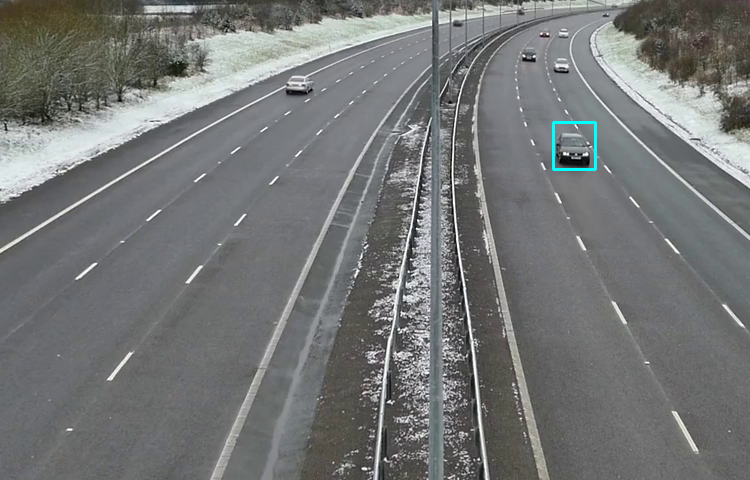

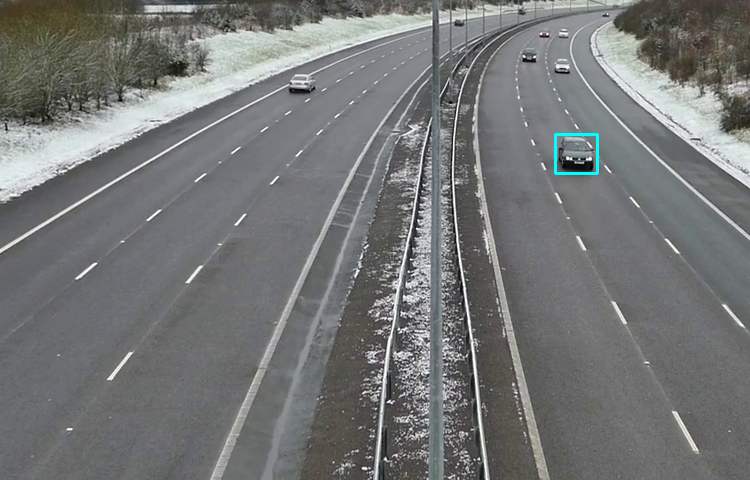

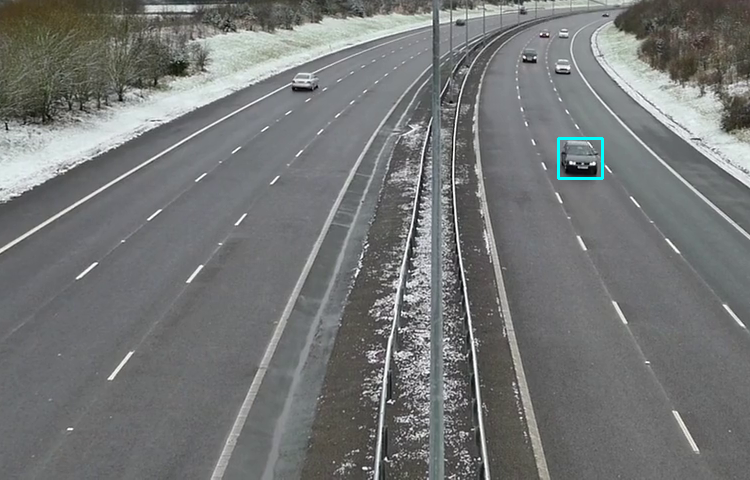

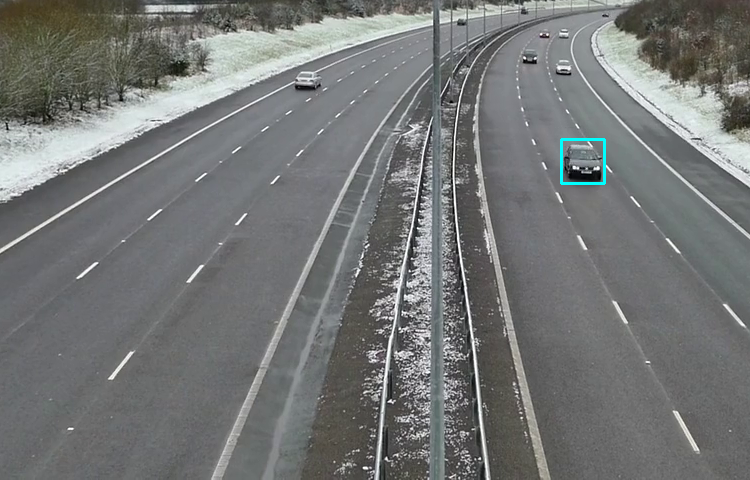

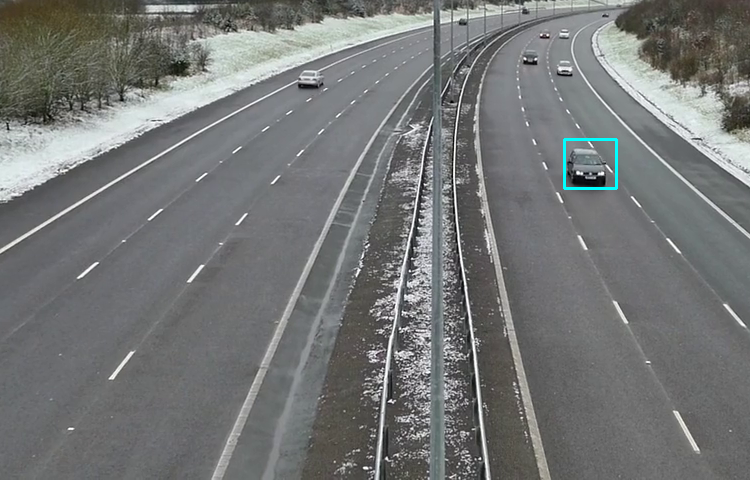

...

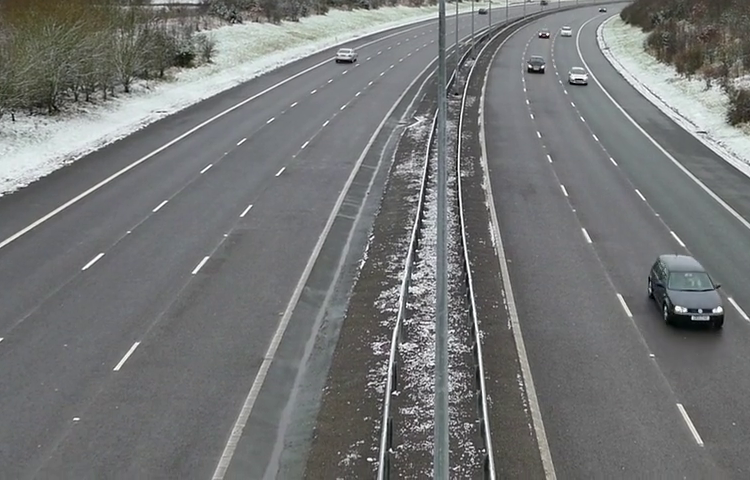

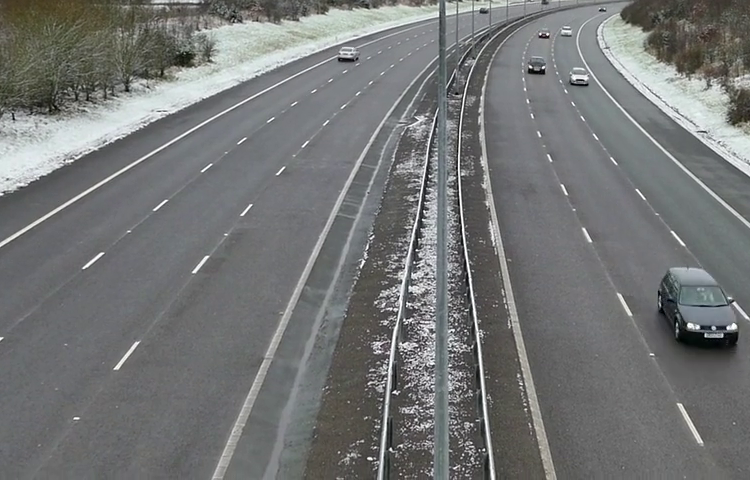

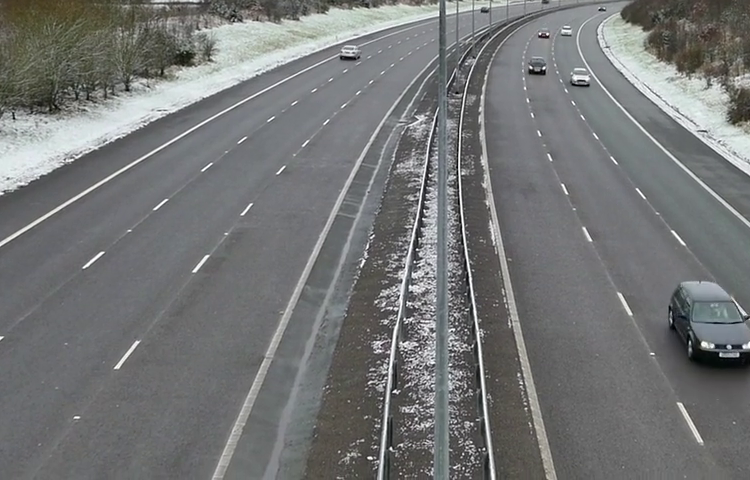

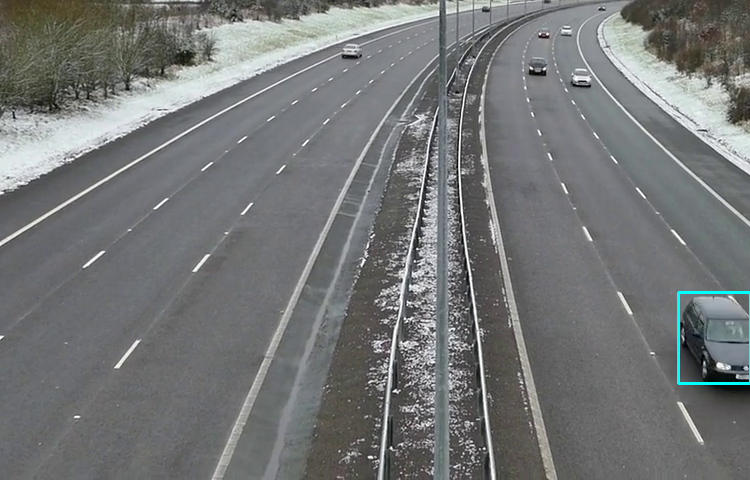

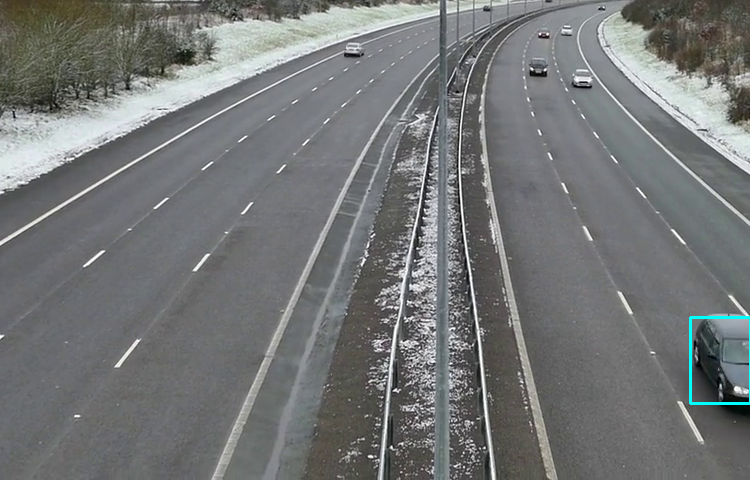

In [15]:
vpath = '/content/drive/MyDrive/Computer Vissions/Module 6/Take Home Project/'

def motion_tracking(path):
  cap = cv2.VideoCapture(vpath + "roadsVid.mp4")

  if not cap.isOpened():
    print("Error: Could not open video file")
    return

  prev_frame = None

  index = 0

  while True:
    ret, frame = cap.read()

    if not ret:
      break

    if prev_frame is not None:
      # Focus on a specific part by cropping the frame
      roi = frame[240:720, 150:900]
      # use gaussian to reduce blur
      frame_blur = cv2.GaussianBlur(roi, (15, 15), 0)
      # Take the difference in the two frames
      diff_frame = cv2.absdiff(frame_blur, roi)
      # Convert to grayscale
      diff_frame_gray = cv2.cvtColor(diff_frame, cv2.COLOR_BGR2GRAY)
      # Take pixel values that have values 10-255
      _, threshold_frame = cv2.threshold(diff_frame_gray, 10, 255, cv2.THRESH_BINARY)
      # find theareas of contour in the image
      contours, _ = cv2.findContours(threshold_frame, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

      for contour in contours:
        # Checks to see if the contour is with the ranges indicated
        # These were chosen through much trial and error
        if 600 < cv2.contourArea(contour) < 2250 or 2500 < cv2.contourArea(contour) < 3000:
          (x, y, w, h) = cv2.boundingRect(contour)
          cv2.rectangle(roi, (x, y), (x + w, y + h), (255, 255, 0), 2)

      cv2_imshow(roi)

    prev_frame = frame

    key = cv2.waitKey(30)
    if key == ord('q'):
      break

    elif index == 24:
      break

    index += 1

  cap.release()
  cv2.destroyAllWindows()
motion_tracking(vpath)